In [1]:
import sys, os
module_rootdir = '../../..'
dataset_rootdir = '../../../..'
label_rootdir = module_rootdir
sys.path.append(module_rootdir)

import config_dataset
from modules.dataset_utils.kitti_dataset_utils import constants
from modules.dataset_utils.kitti_dataset_utils.constants import _IGNORED_CLASS_ID_, _IDX_TO_OBJ_CLASS_
from modules.proposal.constants import _MATCH_CRITERIA_, _SHRINK_FACTOR_
from modules.dataset_utils.kitti_dataset_utils.kitti_remap_utils import load_all_sequence_groundtruths_json
from modules.dataset_utils.kitti_objdetect_dataloader import KittiTrackingDataset_2DObjectDetection, extract_valid_bbox
from modules.proposal.box_association import fcos_match_locations_to_gt_main
from modules.proposal.box_functions import gen_grid_coord 
from modules.plot.viz_annotation import vizualize_bbox_resized, draw_associations_single_image, draw_associations_single_image2

device = 'cuda'

In [2]:
gt_labels_train, _, _ = load_all_sequence_groundtruths_json(
    config_dataset.kitti_train_sequences_folders, 
    config_dataset.kitti_remapped_label_file_path, 
    label_rootdir, 
    dataset_rootdir)

gt_labels_val, _, _ = load_all_sequence_groundtruths_json(
    config_dataset.kitti_val_sequences_folders, 
    config_dataset.kitti_remapped_label_file_path, 
    label_rootdir, 
    dataset_rootdir)

# init data-loader
kitti_dataset = KittiTrackingDataset_2DObjectDetection(
    gt_labels = gt_labels_train, 
    image_new_shape = (constants._IMG_D_, constants._IMG_RESIZED_H_, constants._IMG_RESIZED_W_),
    device = device, 
    subset = -1,
    shuffle_dataset = True,
    augment = False)

Loading JSON file .. please wait
Sequence: 0000
Sequence: 0001
Sequence: 0002
Sequence: 0003
Sequence: 0004
Sequence: 0005
Sequence: 0006
Sequence: 0008
Sequence: 0009
Sequence: 0011
Sequence: 0012
Sequence: 0015
Sequence: 0016
Sequence: 0017
Sequence: 0019
Sequence: 0020
Loading JSON file .. please wait
Sequence: 0007
Sequence: 0010
Sequence: 0013
Sequence: 0014
Sequence: 0018


In [3]:
feat_h, feat_w = constants._OUT_FEAT_SIZE_H_, constants._OUT_FEAT_SIZE_W_
strides_h, strides_w = constants._STRIDE_H_, constants._STRIDE_W_
grid_coord = gen_grid_coord(feat_w, feat_h, strides_w, strides_h, device)

print('strides width: ============================================>')
print(strides_w)
print('strides height: ===========================================>')
print(strides_h)
print('feature width: ============================================>')
print(feat_w)
print('feature height: ===========================================>')
print(feat_h)

strides width: ============================================>
4.004587155963303
strides height: ===========================================>
4.046153846153846
feature width: ============================================>
218
feature height: ===========================================>
65


In [4]:
image, labels = kitti_dataset.__getitem__(0)
print(image.shape)
print(labels.keys())

torch.Size([3, 263, 873])
dict_keys(['img_path', 'bbox', 'obj_class_label'])


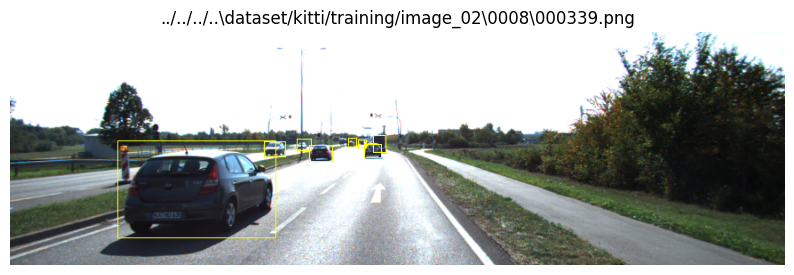

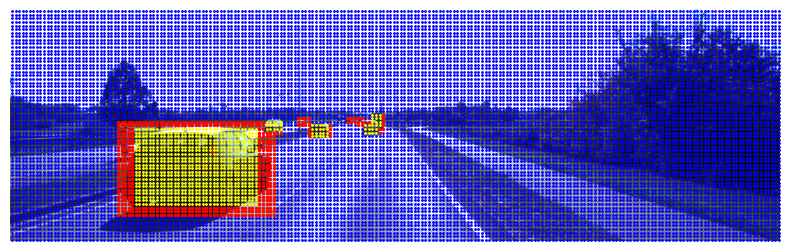

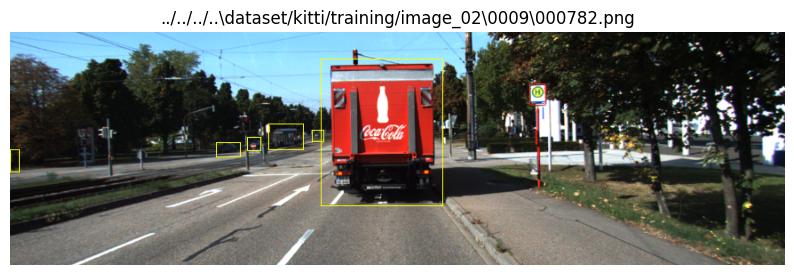

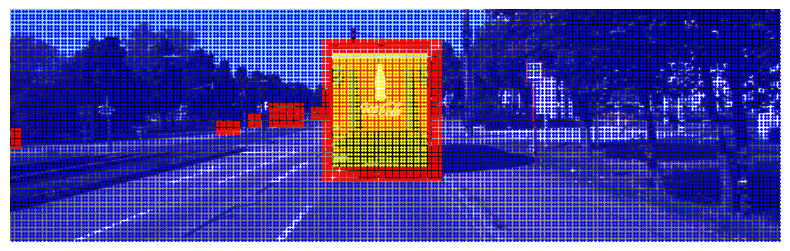

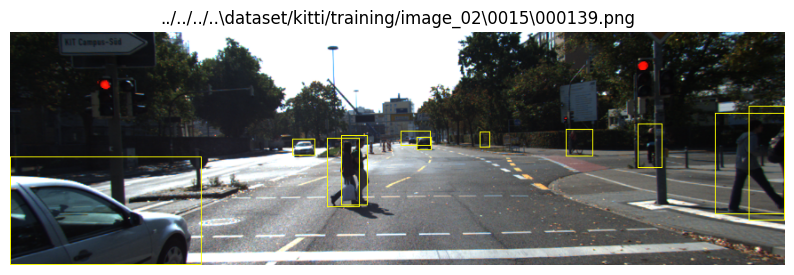

...

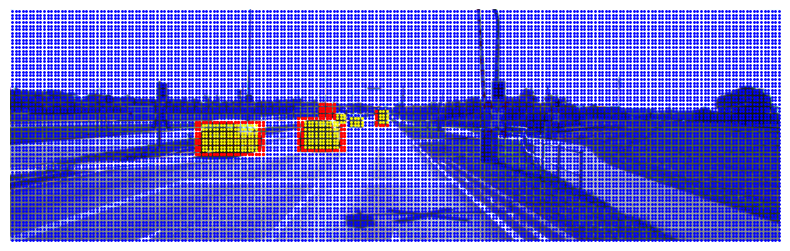

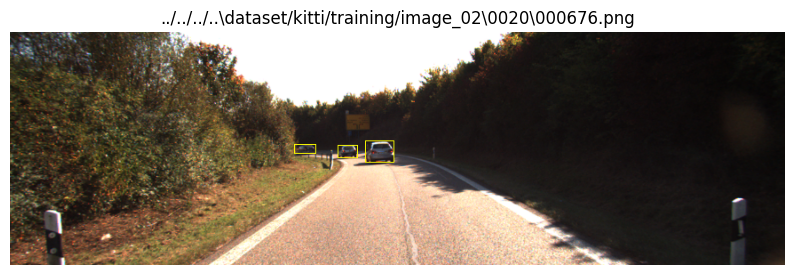

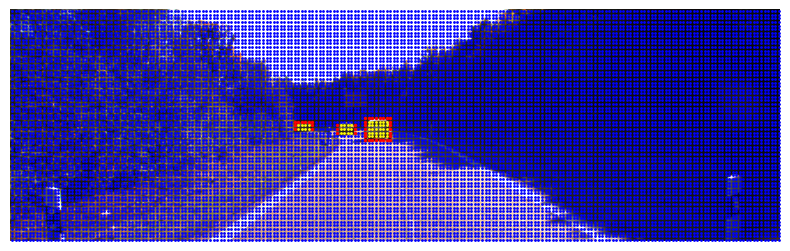

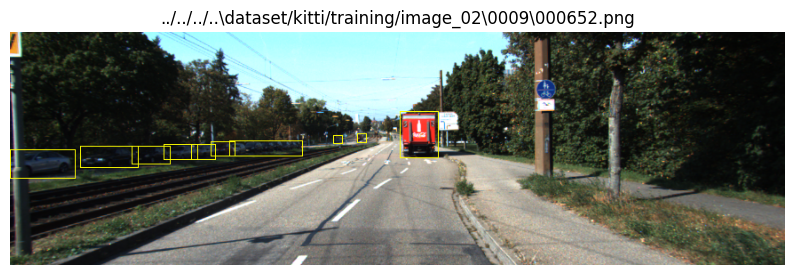

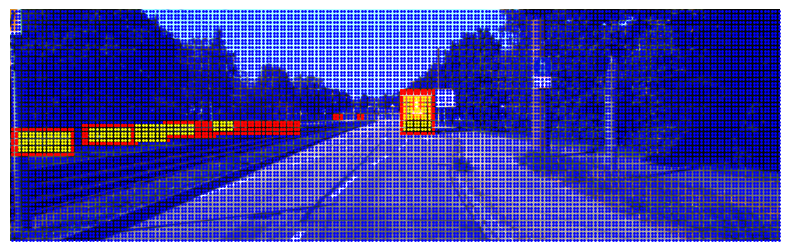

In [5]:
image_idx = [14, 15, 16, 17, 18, 19, 20, 27, 29, 37, 53, 61, 63, 64, 89, 92, 93, 99]

for i in range(len(image_idx)):
    image, labels = kitti_dataset.__getitem__(image_idx[i])
    img_path = labels['img_path']
    bbox = labels['bbox']
    cls_label = labels['obj_class_label']
    bbox = bbox.to(device)
    cls_label = cls_label.to(device)

    # to visualize the bboxes uncomment the below lines of code
    print('=' * 150)
    vizualize_bbox_resized(img_path, bbox.cpu().numpy(), constants._IMG_RESIZED_W_, constants._IMG_RESIZED_H_, figsize=(10,8))
    # print(bbox)
    # print(cls_label)

    matched_gt_class, \
    matched_gt_boxes = fcos_match_locations_to_gt_main(
        grid_coord, bbox, cls_label, device, 
        _IGNORED_CLASS_ID_, _SHRINK_FACTOR_, _MATCH_CRITERIA_)   # 'closest_box' or 'smallest_area'
    
    valid_locations = {}
    invalid_locations = {}
    valid_associated_boxes = {}

    ignored_mask = matched_gt_class == -2
    background_mask = matched_gt_class == -1
    positive_mask = matched_gt_class >= 0
    positive_locations = grid_coord[positive_mask].cpu().numpy()
    background_locations = grid_coord[background_mask].cpu().numpy()
    ignored_locations = grid_coord[ignored_mask].cpu().numpy()
    valid_associated_boxes = matched_gt_boxes[positive_mask].cpu().numpy()

    draw_associations_single_image2(
        img_path, 
        constants._IMG_RESIZED_W_, 
        constants._IMG_RESIZED_H_,
        positive_locations, 
        background_locations,
        ignored_locations,
        figsize=(8,6)
    )